# Packages

In [407]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import time
from matplotlib.dates import DateFormatter
from matplotlib import dates
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import KFold
import warnings
import holidays
from scipy import stats
import calendar
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)
warnings.filterwarnings('ignore')

## Graphical parameter setting

plot parameters initialization:

In [408]:
## parameter setting for graphs
large = 22; med = 16; small = 12
params = {'axes.titlesize': large,
          'legend.fontsize': med,
          'figure.figsize': (16, 10),
          'axes.labelsize': med,
          'axes.titlesize': med,
          'xtick.labelsize': med,
          'ytick.labelsize': med,
          'figure.titlesize': large}
plt.rcParams.update(params)
plt.style.use('seaborn-whitegrid')

In [ ]:
def lag1_sd(x):  # traffic standard deviation of the first 10 minutes 20 minutes prior to scheduled hour
    val = np.nan
    if x >=pd.Timestamp('2016-08-28 07:43:00'):
        val = traffic.loc[pd.date_range(x - pd.Timedelta("30min"),x - pd.Timedelta("20min"),freq ='min'),"Traffic.Ordinal"].std(skipna = True)
    return(val)

In [579]:
test

,ID,Vessel.Name,Scheduled.Departure,Trip,Day,Month,Day.of.Month,Year,Full.Date,Vessel.Name_Kfold_Target_Enc,...,lag2,lag3,lag4,Delay.Indicator,Severe.Weather,Sailings.Ratio,Scheduled.Departure.min,Vessel.Freq,Summer.Season,off.Season
0,1,Queen of Coquitlam,5:15 AM,Duke Point to Tsawwassen,Monday,11,27,2017,2017-11-27,0.198049,...,1.545455,1.181818,1.272727,NaN,False,0.607450,315,0.058142,False,False
1,9,Queen of Cowichan,6:30 AM,Departure Bay to Horseshoe Bay,Monday,11,27,2017,2017-11-27,0.220816,...,1.181818,1.363636,1.727273,NaN,False,0.607450,390,0.050369,False,False
2,16,Queen of Capilano,6:00 AM,Horseshoe Bay to Snug Cove (Bowen Is.),Monday,11,27,2017,2017-11-27,0.225757,...,1.272727,1.000000,1.000000,NaN,False,0.607450,360,0.131524,False,False
3,31,Queen of Oak Bay,6:30 AM,Horseshoe Bay to Departure Bay,Monday,11,27,2017,2017-11-27,0.256083,...,1.181818,1.363636,1.727273,NaN,False,0.607450,390,0.069628,False,False
4,46,Queen of Surrey,6:20 AM,Langdale to Horseshoe Bay,Monday,11,27,2017,2017-11-27,0.290407,...,1.363636,1.727273,1.272727,NaN,False,0.607450,380,0.136395,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12371,12349,Queen of Capilano,10:00 PM,Horseshoe Bay to Snug Cove (Bowen Is.),Friday,3,30,2018,2018-03-30,0.225757,...,2.000000,2.000000,2.272727,NaN,False,1.132961,1320,0.131524,False,False
12372,12358,Queen of Cowichan,10:10 PM,Horseshoe Bay to Departure Bay,Friday,3,30,2018,2018-03-30,0.220816,...,2.000000,2.000000,2.000000,NaN,False,1.132961,1330,0.050369,False,False
12373,12284,Coastal Inspiration,10:45 PM,Tsawwassen to Duke Point,Friday,3,30,2018,2018-03-30,0.134022,...,2.000000,2.272727,3.000000,NaN,False,1.132961,1365,0.056843,False,False
12374,12325,Queen of Alberni,10:45 PM,Duke Point to Tsawwassen,Friday,3,30,2018,2018-03-30,0.080936,...,2.000000,2.272727,3.000000,NaN,False,1.132961,1365,0.051303,False,False


# Functions

In [409]:
## Adjust graph spines
def adjust_spines(ax, spines):
    for loc, spine in ax.spines.items():
        if loc in spines:
            spine.set_position(('outward', 20))  # outward by 10 points
            spine.set_smart_bounds(True)
        else:
            spine.set_color('none')  # don't draw spine
            
### K fold target encoding for training test
class KFoldTargetEncoderTrain(BaseEstimator,TransformerMixin):

    def __init__(self, colnames,targetName,n_fold=5,verbosity=True,discardOriginal_col=False):

        self.colnames = colnames
        self.targetName = targetName
        self.n_fold = n_fold
        self.verbosity = verbosity
        self.discardOriginal_col = discardOriginal_col

    def fit(self, X, y=None):
        return self


    def transform(self,X):

        assert(type(self.targetName) == str)
        assert(type(self.colnames) == str)
        assert(self.colnames in X.columns)
        assert(self.targetName in X.columns)

        mean_of_target = X[self.targetName].mean()
        kf = KFold(n_splits = self.n_fold, shuffle = False, random_state=2019)



        col_mean_name = self.colnames + '_' + 'Kfold_Target_Enc'
        X[col_mean_name] = np.nan

        for tr_ind, val_ind in kf.split(X):
            X_tr, X_val = X.iloc[tr_ind], X.iloc[val_ind]

            X.loc[X.index[val_ind], col_mean_name] = X_val[self.colnames].map(X_tr.groupby(self.colnames)[self.targetName].mean())

        X[col_mean_name].fillna(mean_of_target, inplace = True)

        if self.verbosity:

            encoded_feature = X[col_mean_name].values
            print('Correlation between the new feature, {} and, {} is {}.'.format(col_mean_name,
                                                                                      self.targetName,
                                                                                      np.corrcoef(X[self.targetName].values, encoded_feature)[0][1]))
        if self.discardOriginal_col:
            X = X.drop(self.targetName, axis=1)
            

        return(X)
    
### K Fold target encoding for test set
class KFoldTargetEncoderTest(BaseEstimator, TransformerMixin):
    
    def __init__(self,train,colNames,encodedName):
        
        self.train = train
        self.colNames = colNames
        self.encodedName = encodedName
        
    def fit(self, X, y=None):
        return self
    
    def transform(self,X):
        mean =  self.train[[self.colNames,
                self.encodedName]].groupby(
                                self.colNames).mean().reset_index() 
        
        dd = {}
        for index, row in mean.iterrows():
            dd[row[self.colNames]] = row[self.encodedName]
        X[self.encodedName] = X[self.colNames]
        X = X.replace({self.encodedName: dd})
    
        return(X)

## correlation of multivariate analysis    
def corrfunc(x, y, **kws):
    r, _ = stats.pearsonr(x, y)
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(r),
                xy=(.1, .9), xycoords=ax.transAxes)
    
## Traffic data feature manipulation
def lag1_mean(x): # traffic mean of the first 10 minutes 20 minutes prior to scheduled hour
    val = np.nan
    if x >=pd.Timestamp('2016-08-28 07:43:00'):
        val = traffic.loc[pd.date_range(x - pd.Timedelta("30min"),x - pd.Timedelta("20min"),freq ='min'),"Traffic.Ordinal"].mean(skipna = True)
    return(val)

def lag2_mean(x): # traffic mean of the second 10 minutes 20 minutes prior to scheduled hour
    val = np.nan
    if x >=pd.Timestamp('2016-08-28 07:43:00'):
        val = traffic.loc[pd.date_range(x - pd.Timedelta("40min"),x - pd.Timedelta("30min"),freq ='min'),"Traffic.Ordinal"].mean(skipna = True)
    return(val)

def lag3_mean(x): # traffic mean of the third 10 minutes 20 minutes prior to scheduled hour
    val = np.nan
    if x >=pd.Timestamp('2016-08-28 07:43:00'):
        val = traffic.loc[pd.date_range(x - pd.Timedelta("50min"),x - pd.Timedelta("40min"),freq ='min'),"Traffic.Ordinal"].mean(skipna = True)
    return(val)

def lag4_mean(x): # traffic mean of the fourth 10 minutes 20 minutes prior to scheduled hour
    val = np.nan
    if x >=pd.Timestamp('2016-08-28 07:53:00'):
        val = traffic.loc[pd.date_range(x - pd.Timedelta("60min"),x - pd.Timedelta("50min"),freq ='min'),"Traffic.Ordinal"].mean(skipna = True)
    return(val)
test["Date_time"][1]

def lag1_sd(x):  # traffic standard deviation of the first 10 minutes 20 minutes prior to scheduled hour
    val = np.nan
    if x >=pd.Timestamp('2016-08-28 07:43:00'):
        val = traffic.loc[pd.date_range(x - pd.Timedelta("30min"),x - pd.Timedelta("20min"),freq ='min'),"Traffic.Ordinal"].std(skipna = True)
    return(val)

def lag2_sd(x):  # traffic standard deviation of the second 10 minutes 20 minutes prior to scheduled hour
    val = np.nan
    if x >=pd.Timestamp('2016-08-28 07:43:00'):
        val = traffic.loc[pd.date_range(x - pd.Timedelta("40min"),x - pd.Timedelta("30min"),freq ='min'),"Traffic.Ordinal"].std(skipna = True)
    return(val)

def lag3_sd(x):  # traffic standard deviation of the third 10 minutes 20 minutes prior to scheduled hour
    val = np.nan
    if x >=pd.Timestamp('2016-08-28 07:43:00'):
        val = traffic.loc[pd.date_range(x - pd.Timedelta("50min"),x - pd.Timedelta("40min"),freq ='min'),"Traffic.Ordinal"].std(skipna = True)
    return(val)

def lag4_sd(x):  # traffic standard deviation of the fourth 10 minutes 20 minutes prior to scheduled hour
    val = np.nan
    if x >=pd.Timestamp('2016-08-28 07:43:00'):
        val = traffic.loc[pd.date_range(x - pd.Timedelta("60min"),x - pd.Timedelta("50min"),freq ='min'),"Traffic.Ordinal"].std(skipna = True)
    return(val)

def add_num_sailings_ratio(data):
    avgs = data.groupby(['Year','Month'], as_index=False)['Trip'].count()

    avgs['Trip'] = avgs['Trip']/data.groupby(['Year','Month'], as_index=False)['Day.of.Month'].nunique()
    tripCounts = pd.merge(data, avgs.rename(columns={'Trip':'avg.Trips'}), how='left', on=['Year', 'Month'])
    tripCounts_with_date = pd.merge(tripCounts, data.groupby('Full.Date', as_index=False)['Trip'].count().rename(columns={'Trip':'num.Trips'}), how='left', on='Full.Date')
    
    tripCounts_with_date['Sailings.Ratio'] = tripCounts_with_date['num.Trips']/tripCounts_with_date['avg.Trips']
    return tripCounts_with_date.drop(columns=['avg.Trips', 'num.Trips'])

def add_weather_events(dates):
    weather_events = severe_weather_dates = ['04 December 2016','05 December 2016','24 November 2016', 
                                             '14 October 2016', '13 November 2017', '20 December 2018', '19 November 2017', 
                                             '14 November 2017', '15 November 2017', '07 April 2017', '21 January 2018', '21 January 2018', '28 February 2018']
    severe_weather = dates.isin(weather_events)
    return severe_weather

In [416]:
## load data
train = pd.read_csv("train_update.csv",index_col=0)
vancouver = pd.read_csv("vancouver_update.csv",index_col=0)
victoria = pd.read_csv("victoria_update.csv",index_col=0)
traffic = pd.read_csv("traffic_clean.csv",index_col=0)
test = pd.read_csv("test.csv",index_col=0)

In [411]:
time = pd.to_datetime(train['Scheduled.Departure']).dt.strftime('%H:%M:%S')

## Data manipulation for Status<a class="tocSkip">
Since hyperparameter tuning is a time consuming process, we will take 7 steps to perform hyperparamter tuning by AUC: 
- Having different delay causes, we decided to reduce the cardinality of the category by combining similar levels.
- Remove the observations marked as delay that we did not have information to account for to remove noises.
- To maintain as much as information, we decided to retain the dealyed observations caused by traffic, operation, weather and mechanical issues.

In [551]:
train["Status"].value_counts()

On Time                                            40516
Traffic delays                                      3663
Operational delay                                   1376
Ongoing traffic volume delay                        1211
Heavy traffic volume                                 724
Mechanical difficulties with vessel                  362
Ongoing delay due to earlier operational delay       254
Unknown                                              254
Cancelled                                            220
Ongoing delays due to earlier mechanical issues      194
Stalled vehicle on car deck                          177
Weather delays                                        93
Vessel congestion at berths                           83
Loading delay                                         66
Ongoing weather delays                                52
Crew conducted required safety drill                  37
Delays due to extreme weather                         37
High winds                     

In [550]:
## traffic delay
#train.loc[train["Status"].isin(["Traffic delays","Ongoing traffic volume delay","Heavy traffic volume","Vessel congestion at berths","Traffic transfer delays"]),"Status"] = "Traffic delay"

## operational dely
train.loc[train["Status"].isin(["Operational delay","Operational Delay"]),"Status"] = "Operational delay"

## weather delay
#train.loc[train["Status"].isin(["Weather delays","Ongoing weather delays","Delays due to extreme weather"]),"Status"] = "Weather delay"

## Mechanical issue
#train.loc[train["Status"].isin(["Mechanical difficulties with vessel","Mechanical difficulties with terminal equipment","Ongoing delays due to earlier mechanical issues"]),"Status"] = "Mechanical issue"

In [572]:
## Add Delay.Indicator column
test.reset_index(drop = True)
test["Delay.Indicator"] = np.nan

traffic.reset_index(inplace = True)
traffic.rename(columns = {"index":"Date"},inplace = True)
train["Day.of.Month"] = train["Day.of.Month"].astype("object")

## Add a column of severe weather
train['Severe.Weather'] = add_weather_events(train['Full.Date'])
train = add_num_sailings_ratio(train)

test['Severe.Weather'] = add_weather_events(test['Full.Date'])
test = add_num_sailings_ratio(test)

## Add a column of Scheduled.Departure in minutes
time_train = pd.to_datetime(train['Scheduled.Departure']).dt.strftime('%H:%M:%S')
train['Scheduled.Departure.min'] = pd.to_timedelta(time_train).astype('timedelta64[m]').astype(int)

time_test = pd.to_datetime(test['Scheduled.Departure']).dt.strftime('%H:%M:%S')
test['Scheduled.Departure.min'] = pd.to_timedelta(time_test).astype('timedelta64[m]').astype(int)

## Vessel name frequency
train["Vessel.Freq"] = train["Vessel.Name"].apply(lambda x: train["Vessel.Name"].value_counts(normalize=True)[x])
test["Vessel.Freq"] = test["Vessel.Name"].apply(lambda x: train1["Vessel.Name"].value_counts(normalize=True)[x])

## Season encoded
train['Summer.Season'] = (train['Month'].isin([6,7,8]))
test['Summer.Season'] = (test['Month'].isin([6,7,8]))

train['off.Season'] = (train['Month'].isin([1, 2]))
test['off.Season'] = (test['Month'].isin([1, 2]))

# Exploratory data analysis

## Train

### Target encoding of major categorical variables

In [432]:
## Encode Vessel.Name
targetc = KFoldTargetEncoderTrain('Vessel.Name','Delay.Indicator',n_fold=5)
train = targetc.fit_transform(train)
test_targetc = KFoldTargetEncoderTest(train,
                                      'Vessel.Name',
                                      'Vessel.Name_Kfold_Target_Enc')
test = test_targetc.fit_transform(test)

## Encode Vessel.Name
targetc = KFoldTargetEncoderTrain('Trip','Delay.Indicator',n_fold=5)
train = targetc.fit_transform(train)
test_targetc = KFoldTargetEncoderTest(train,
                                     'Trip',
                                      'Trip_Kfold_Target_Enc')
test = test_targetc.fit_transform(test)

## Encode Day.of.Month
targetc = KFoldTargetEncoderTrain('Day.of.Month','Delay.Indicator',n_fold=5)
train = targetc.fit_transform(train)
test_targetc = KFoldTargetEncoderTest(train,
                                     'Day.of.Month',
                                      'Day.of.Month_Kfold_Target_Enc')
test = test_targetc.fit_transform(test)

Correlation between the new feature, Vessel.Name_Kfold_Target_Enc and, Delay.Indicator is 0.14538710199757263.
Correlation between the new feature, Trip_Kfold_Target_Enc and, Delay.Indicator is 0.13333638368739953.
Correlation between the new feature, Day.of.Month_Kfold_Target_Enc and, Delay.Indicator is -0.018449308334920443.


### Distribution of Delay Status

According to the distribution of delay status
- The delayed status of **Crew conducted required safty drill**, **Staffing issues**, **Loading delay**,**Marine traffic delay**,**Fuelling related delay**,**Delayed ticketing** ,**Delays with catering supplies**, **Sewage removal delays, Vessel start-up delays** can not be explained by the data because we do not have relevant information. To stablize our predictive models, the observations with those status will be cut out from the data.


----------------Distribution of Delay Status----------------



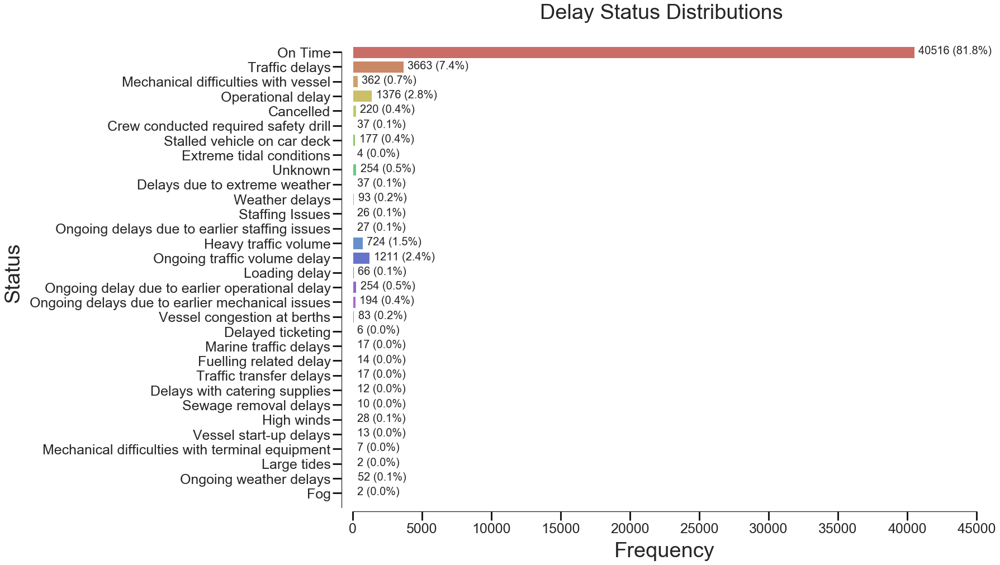

In [552]:
print('\n----------------Distribution of Delay Status----------------\n')
plt.figure(figsize=(20,15))
colors = sns.color_palette("hls", 22)
ax = sns.countplot(y = 'Status', data=train, palette=colors)

total = len(train['Status'])

## set count and percentage labels above bars
for p in ax.patches:
        percentage = '{} ({:.1f}%)'.format(p.get_width(),100 * p.get_width()/total)
        x = p.get_x() + p.get_width() +300
        y = p.get_y() + p.get_height()/1.5
        ax.annotate(percentage, (x, y),size = 20)

ax.set_xlabel("Frequency",size = 38,labelpad=12)
ax.set_ylabel("Status",size = 38,labelpad=12)
ax.set_title('Delay Status Distributions \n', fontsize=38)

ax.set_xticks([5000*i for i in range(10)])


ax.spines['left'].set_bounds(0,31)
ax.tick_params(axis= "x",direction = 'out',which='major', length=16,width=3, color='k',labelsize = 25)
ax.tick_params(axis= "y",direction = 'out',which='major', length=16,width=3, color='k',labelsize = 25)
adjust_spines(ax, ['left', 'bottom'])


plt.show()

In [375]:
## Remove noisy observations because there are some subcategories that can not be predicted by our exisiting information.
## Weather delay
#train.loc[train["Status"].isin(["Weather delay","Extreme tidal conditions","High winds","Large tides","Fog"]),"Status"] = "Weather delay"

#train = train.loc[train["Status"].isin(["On Time","Traffic delay","Operational delay","Mechanical issue","Weather delay","Cancelled","Stalled vehicle on car deck","Unknown","Marine traffic delay"]),:]
#train.reset_index(drop = True,inplace = True)

### Important features extraction

Time related time variables **Month**,**Day**,**Weekend.Indicator**,**Holiday.Indicator** were derived as potential predicators and their predictive power will be evaluated.

In [484]:
train["Day"].value_counts()

Friday       7594
Monday       7241
Thursday     7151
Sunday       7049
Tuesday      6916
Wednesday    6847
Saturday     6706
Name: Day, dtype: int64

In [485]:
## train: Feature extraction
train["Full.Date"] = pd.to_datetime(train["Full.Date"])
train["Month"]=pd.Series(pd.DatetimeIndex(train["Full.Date"]).month)
train["Day"] = train["Full.Date"].apply(lambda x: dt.datetime.strftime(x, '%A'))
train["weekend.Indicator"] = train["Day"].isin(["Saturday","Sunday"])

## test: Feature extraction
test.reset_index(inplace = True)
test["Full.Date"] = pd.to_datetime(test["Full.Date"])
test["Month"]=pd.Series(pd.DatetimeIndex(test["Full.Date"]).month)
test["Day"] = test["Full.Date"].apply(lambda x: dt.datetime.strftime(x, '%A'))
test["weekend.Indicator"] = test["Day"].isin(["Saturday","Sunday"])

In [438]:
## add a date column for train
train["Date_time"] = pd.to_datetime(train["Full.Date"].astype("str") +" "+ pd.to_datetime(train["Scheduled.Departure"]).apply(lambda x: x.strftime("%H:%M:%S")).astype("str"))
test["Date_time"] = pd.to_datetime(test["Full.Date"].astype("str") +" "+ pd.to_datetime(test["Scheduled.Departure"]).apply(lambda x: x.strftime("%H:%M:%S")).astype("str"))

## holiday indicator for train
train["holidays_indicator"] = train["Date_time"].apply(lambda x:x in holidays.CA())

## holiday indicator for test
test["holidays_indicator"] = test["Date_time"].apply(lambda x:x in holidays.CA())

### Number of sailings every day

In [439]:
sailings_train = train.loc[:,["Vessel.Name","Full.Date"]].groupby("Full.Date").count()
sailings_test = test.loc[:,["Vessel.Name","Full.Date"]].groupby("Full.Date").count()


train["Num.of.sailings"] = train["Full.Date"].apply(lambda x: sailings_train.loc[x,"Vessel.Name"])
test["Num.of.sailings"] = test["Full.Date"].apply(lambda x: sailings_test.loc[x,"Vessel.Name"])

#### Visualization of Year to the response

The target variable (**Delay indicator**) is not stratified by year.

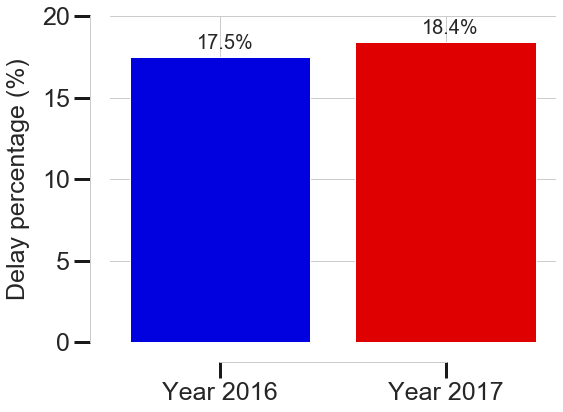

In [440]:
train_year = train[["Year","Delay.Indicator"]]
train_year = train_year.groupby("Year").mean().reset_index()
train_year['Year'] = train_year['Year'].astype('object')

fig, ax = plt.subplots(1,1,figsize=(8,6))

colors = ["#0101DF", "#DF0101"]
Year = [2016,2017]

Indicator = list(train_year["Delay.Indicator"].apply(lambda x: round(100*x,1)))
ax.bar(Year,Indicator,color = colors)

for p in ax.patches:
        percentage = '{}%'.format(p.get_height())
        x = p.get_x() + p.get_width()/2.7 
        y = p.get_y() + p.get_height()+0.5
        ax.annotate(percentage, (x, y),size = 20)

        
ax.set_xticks(Year)
ax.set_xticklabels(['Year 2016', 'Year 2017'])

ax.spines['bottom'].set_bounds(2016, 2017)

ax.tick_params(axis= "x",direction = 'out',which='major', length=16,width=3, color='k',labelsize = 25)
ax.tick_params(axis= "y",direction = 'out',which='major', length=16,width=3, color='k',labelsize = 25)
ax.set_ylabel("Delay percentage (%)",size = 25,labelpad=12)
ax.set_yticks([i for i in range(0,21,5)])
adjust_spines(ax, ['left', 'bottom'])

#### Visualization of Month related to the response

Vistially Month is a strong predictor because the Delay frequency varied from month to month ranging from 7.4% to 26.0%

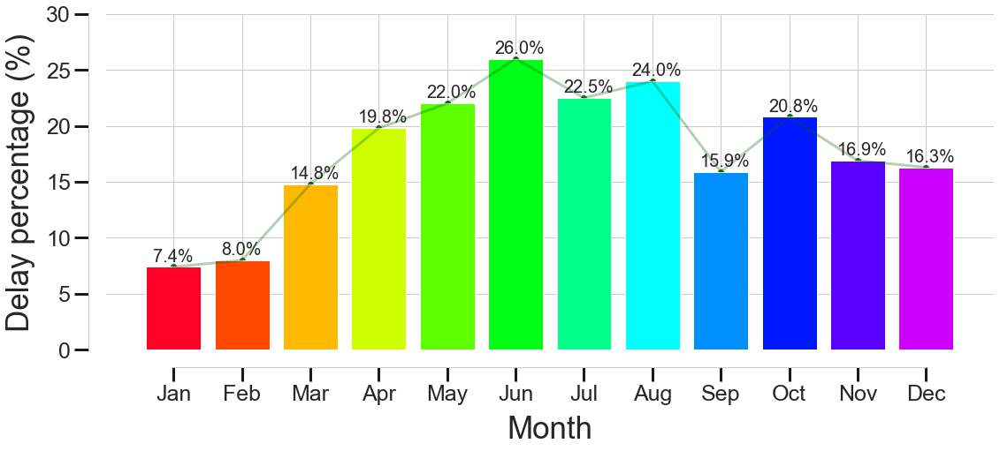

In [441]:
train_month = train[["Month","Delay.Indicator"]]
train_month = train_month.groupby("Month").mean().reset_index()
train_month['Month'] = train_month['Month'].astype('object')

fig, ax = plt.subplots(1,1,figsize=(18,7))
NUM_COLORS = 12
cm = plt.get_cmap('gist_rainbow')
colors = [cm(1.*i/NUM_COLORS) for i in range(NUM_COLORS)]

Month = train_month['Month']
Month_str = train_month['Month'].astype('int').apply(lambda x:calendar.month_abbr[x])
Indicator = list(train_month["Delay.Indicator"].apply(lambda x: round(x*100,1)))

ax.bar(Month,Indicator,color = colors)
ax.plot(Month,Indicator,alpha = 0.3,color = 'darkgreen',linewidth = "3")
ax.scatter(Month,Indicator,alpha = 0.9,color = 'darkgreen')
for p in ax.patches:
        percentage = '{}%'.format(p.get_height())
        x = p.get_x() + p.get_width()/8
        y = p.get_y() + p.get_height()+0.5
        ax.annotate(percentage, (x, y),size = 20)

ax.set_xticks(Month)
ax.set_xticklabels(Month_str)

ax.spines['bottom'].set_bounds(1,12)
ax.tick_params(axis= "x",direction = 'out',which='major', length=16,width=3, color='k',labelsize = 25)
ax.tick_params(axis= "y",direction = 'out',which='major', length=16,width=3, color='k',labelsize = 25)
ax.set_yticks([i for i in range(0,31,5)])
ax.set_ylabel("Delay percentage (%)",size = 35,labelpad=12)
ax.set_xlabel("Month",size = 35,labelpad=12)
adjust_spines(ax, ['left', 'bottom'])

#### Visualization of month related to delay status

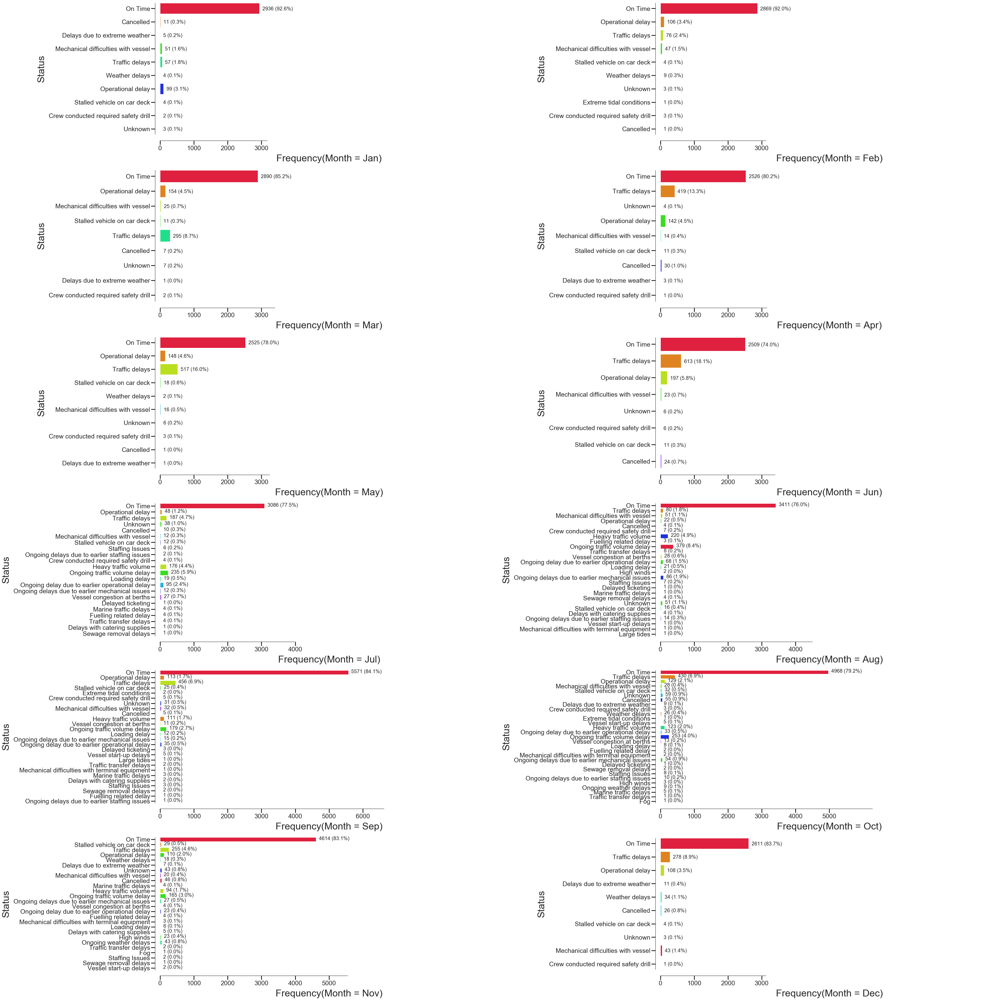

In [556]:
unique_month = np.sort(train["Month"].unique())

fig, axes = plt.subplots(6, 2, figsize=(55, 55))
for i, ax in enumerate(axes.flatten()):
    NUM_COLORS = 8
    cm = plt.get_cmap('gist_rainbow')
    colors = [cm(1. * j / NUM_COLORS) for j in range(NUM_COLORS)]

    train_month = train.loc[train.Month == unique_month[i], :]
    sns.countplot(y='Status', data=train_month, palette=colors, ax=ax)

    total = len(train_month['Status'])

    Month_str = calendar.month_abbr[unique_month[i]]
    ## set count and percentage labels above bars
    for p in ax.patches:
        percentage = '{} ({:.1f}%)'.format(p.get_width(),
                                           100 * p.get_width() / total)
        x = p.get_x() + p.get_width() + 88
        y = p.get_y() + p.get_height() / 1.5
        ax.annotate(percentage, (x, y), size=20)

    ax.set_xlabel("Frequency(Month = {})".format(Month_str),size=38,labelpad=12)
    ax.set_ylabel("Status", size=38, labelpad=12)


    ax.set_xticks([1000 * k for k in range(len(unique_month)-1)])
    
    
    ax.spines['bottom'].set_bounds(0, len(train.loc[train.Month == unique_month[i], "Status"]))
    ax.tick_params(axis="x",
                   direction='out',
                   which='major',
                   length=16,
                   width=3,
                   color='k',
                   labelsize=25)
    ax.tick_params(axis="y",
                   direction='out',
                   which='major',
                   length=16,
                   width=3,
                   color='k',
                   labelsize=25)
    adjust_spines(ax, ['left', 'bottom'])

plt.tight_layout()

#### Visualization of the response againts time

The delay rate varied from hour to hour and 00[24:00] has the highest delay percentage. However, after further investigation we noticed that there were merely 7 observations at time 00 which is too few to be representative of the category so we decided to combine it with the nearest time 23:00.

In [444]:
train_time = train[["Date_time","Delay.Indicator"]]
## round the whole time object up tl hour
#train_time["Round_time"] = train_time["Date_time"].dt.round("H")
#train_time["Round_Hour"] = train_time["Round_time"].apply(lambda x: x.strftime("%H"))

#train_time = train_time[["Round_Hour","Delay.Indicator"]]
#train_time = train_time.groupby("Round_Hour").mean().reset_index()
#train_time['Round_Hour'] = train_time['Round_Hour'].astype('object')

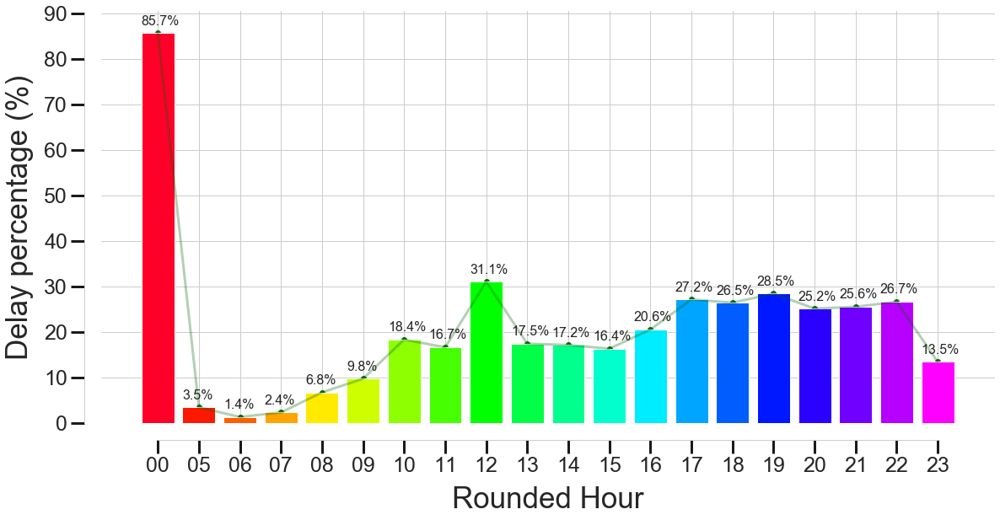

In [448]:
train_time = train[["Date_time","Delay.Indicator"]]
## round the whole time object up tl hour
train_time["Round_time"] = train_time["Date_time"].dt.round("H")
train_time["Round_Hour"] = train_time["Round_time"].apply(lambda x: x.strftime("%H"))

train_time = train_time[["Round_Hour","Delay.Indicator"]]
train_time = train_time.groupby("Round_Hour").mean().reset_index()
train_time['Round_Hour'] = train_time['Round_Hour'].astype('object')


fig, ax = plt.subplots(1,1,figsize=(19,9))
NUM_COLORS = 20
cm = plt.get_cmap('gist_rainbow')
colors = [cm(1.*i/NUM_COLORS) for i in range(NUM_COLORS)]

Hour_str = np.unique(train_time['Round_Hour'])
Hour = [i for i in range(20)]
Indicator = list(train_time["Delay.Indicator"].apply(lambda x: round(x*100,1)))

ax.set_xticks(Hour)
ax.set_xticklabels(Hour_str)

ax.spines['bottom'].set_bounds(0,19)
ax.bar(Hour,Indicator,color = colors)
ax.plot(Hour,Indicator,alpha = 0.3,color = 'darkgreen',linewidth = "3")
ax.scatter(Hour,Indicator,alpha = 0.9,color = 'darkgreen')
for p in ax.patches:
        percentage = '{}%'.format(p.get_height())
        x = p.get_x()
        y = p.get_y() + p.get_height()+1.8
        ax.annotate(percentage, (x, y),size = 16)


ax.tick_params(axis= "x",direction = 'out',which='major', length=16,width=3, color='k',labelsize = 25)
ax.tick_params(axis= "y",direction = 'out',which='major', length=16,width=3, color='k',labelsize = 25)
ax.set_yticks([i for i in range(0,91,10)])
ax.set_ylabel("Delay percentage (%)",size = 35,labelpad=12)
ax.set_xlabel("Rounded Hour",size = 35,labelpad=12)
adjust_spines(ax, ['left', 'bottom'])

#### Visualization of rounded hour related to delay status

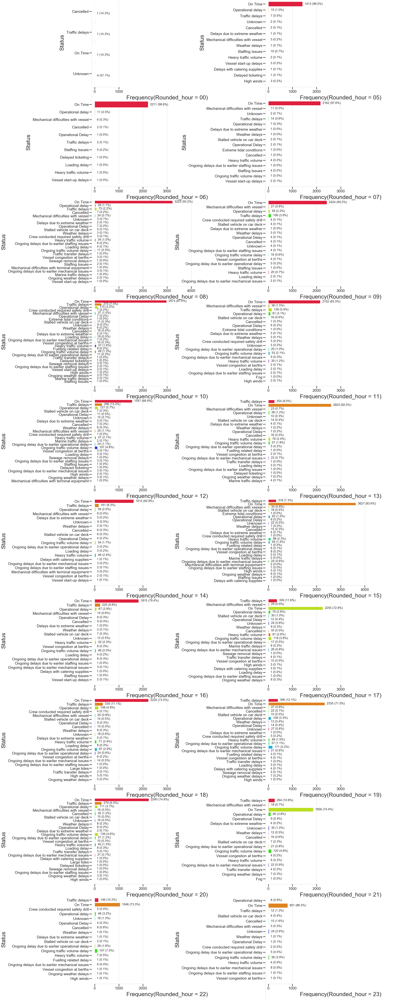

In [447]:
train["Round_time"] = train["Date_time"].dt.round("H")
train["Round_Hour"] = train["Round_time"].apply(lambda x: x.strftime("%H"))
unique_hour = np.sort(train["Round_Hour"].unique())

fig, axes = plt.subplots(10, 2, figsize=(38, 120))
for i, ax in enumerate(axes.flatten()):
    NUM_COLORS = 8
    cm = plt.get_cmap('gist_rainbow')
    colors = [cm(1. * j / NUM_COLORS) for j in range(NUM_COLORS)]

    train_hour = train.loc[train["Round_Hour"] == unique_hour[i], :]
    sns.countplot(y='Status', data=train_hour, palette=colors, ax=ax)

    total = len(train_hour['Status'])

    Hour_str = unique_hour[i]
    ## set count and percentage labels above bars
    for p in ax.patches:
        percentage = '{} ({:.1f}%)'.format(p.get_width(),
                                           100 * p.get_width() / total)
        x = p.get_x() + p.get_width() + 88
        y = p.get_y() + p.get_height() / 1.5
        ax.annotate(percentage, (x, y), size=20)

    ax.set_xlabel("Frequency(Rounded_hour = {})".format(Hour_str),
                  size=38,
                  labelpad=12)
    ax.set_ylabel("Status", size=38, labelpad=12)
    #ax.set_title('Delay Status Distributions \n', fontsize=38)

    ax.set_xticks([1000 * k for k in range(7)])

    ax.spines['left'].set_bounds(0, len(unique_hour)-1)
    ax.tick_params(axis="x",
                   direction='out',
                   which='major',
                   length=16,
                   width=3,
                   color='k',
                   labelsize=25)
    ax.tick_params(axis="y",
                   direction='out',
                   which='major',
                   length=16,
                   width=3,
                   color='k',
                   labelsize=25)
    adjust_spines(ax, ['left', 'bottom'])

plt.tight_layout(h_pad = 1.28)

#### Visualization of Weekend to the response

Weekend indicator is of interest because given the huge dataset, the distribution of the target is different by Weekend indicator

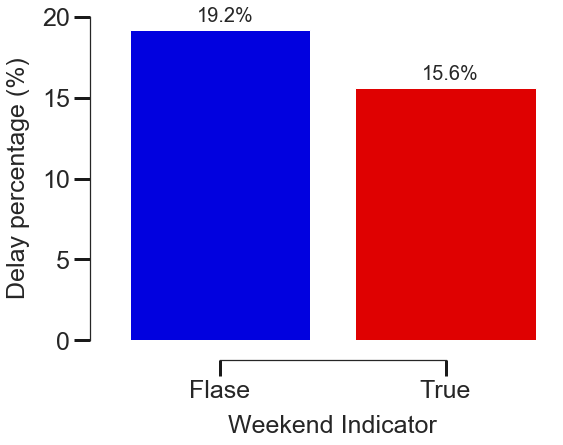

In [486]:
train_week = train[["weekend.Indicator","Delay.Indicator"]]
train_week = train_week.groupby("weekend.Indicator").mean().reset_index()
train_week['weekend.Indicator'] = train_week['weekend.Indicator'].astype('object')

fig, ax = plt.subplots(1,1,figsize=(8,6))

colors = ["#0101DF", "#DF0101"]
weekend = ["Flase","True"]
Indicator = list(train_week["Delay.Indicator"].apply(lambda x: round(100*x,1)))
ax.bar(weekend,Indicator,color = colors)

for p in ax.patches:
        percentage = '{}%'.format(p.get_height())
        x = p.get_x() + p.get_width()/2.7 
        y = p.get_y() + p.get_height()+0.5
        ax.annotate(percentage, (x, y),size = 20)


ax.spines['bottom'].set_bounds(0,1)        
        
ax.tick_params(axis= "x",direction = 'out',which='major', length=16,width=3, color='k',labelsize = 25)
ax.tick_params(axis= "y",direction = 'out',which='major', length=16,width=3, color='k',labelsize = 25)
ax.set_xlabel("Weekend Indicator",size = 25,labelpad=12)
ax.set_ylabel("Delay percentage (%)",size = 25,labelpad=12)
ax.set_yticks([i for i in range(0,21,5)])
adjust_spines(ax, ['left', 'bottom'])

#### Visualization of Weekend related to delay status

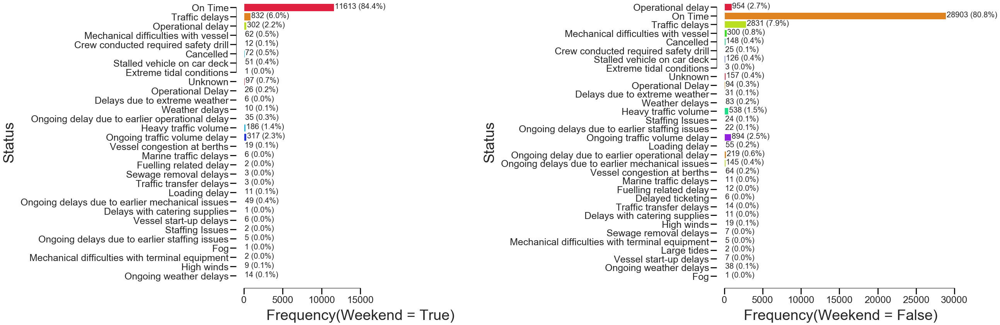

In [488]:
fig, axes = plt.subplots(1, 2, figsize=(36, 12))
unique_week = train['weekend.Indicator'].unique()

for i, ax in enumerate(axes.flatten()):
    NUM_COLORS = 8
    cm = plt.get_cmap('gist_rainbow')
    colors = [cm(1. * j / NUM_COLORS) for j in range(NUM_COLORS)]

    train_week = train.loc[train["weekend.Indicator"] == unique_week[i], :]
    sns.countplot(y='Status', data=train_week, palette=colors, ax=ax)

    total = len(train_week['Status'])

    week = unique_week[i]
    ## set count and percentage labels above bars
    for p in ax.patches:
        percentage = '{} ({:.1f}%)'.format(p.get_width(),
                                           100 * p.get_width() / total)
        x = p.get_x() + p.get_width() + 88
        y = p.get_y() + p.get_height() / 1.5
        ax.annotate(percentage, (x, y), size=20)

    ax.set_xlabel("Frequency(Weekend = {})".format(week),
                  size=38,
                  labelpad=12)
    ax.set_ylabel("Status", size=38, labelpad=12)
    #ax.set_title('Delay Status Distributions \n', fontsize=38)

    ax.set_xticks([5000 * k for k in range(7)])

    ax.spines['left'].set_bounds(0, 7)
    ax.tick_params(axis="x",
                   direction='out',
                   which='major',
                   length=16,
                   width=3,
                   color='k',
                   labelsize=25)
    ax.tick_params(axis="y",
                   direction='out',
                   which='major',
                   length=16,
                   width=3,
                   color='k',
                   labelsize=25)
    adjust_spines(ax, ['left', 'bottom'])

plt.tight_layout()

#### Visualization of Holiday to the response

Holiday indicator is of interest because given the huge dataset, the distribution of the target is different by Holiday indicator.

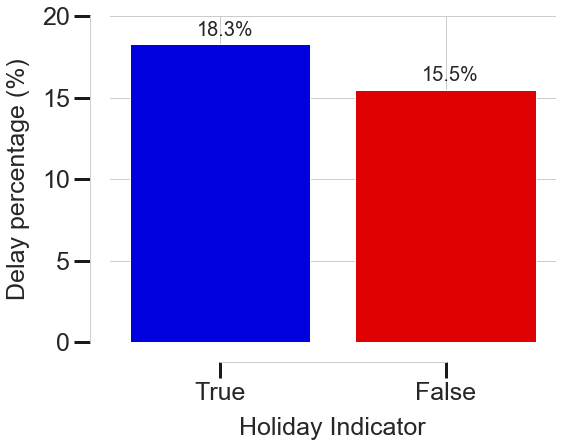

In [451]:
train_holiday = train[["holidays_indicator","Delay.Indicator"]]
train_holiday = train_holiday.groupby("holidays_indicator").mean().reset_index()
train_holiday['holidays_indicator'] = train_holiday['holidays_indicator'].astype('object')

fig, ax = plt.subplots(1,1,figsize=(8,6))

colors = ["#0101DF", "#DF0101"]
holiday = ["False","True"]
Indicator = list(train_holiday["Delay.Indicator"].apply(lambda x: round(100*x,1)))
ax.bar(holiday,Indicator,color = colors)

for p in ax.patches:
        percentage = '{}%'.format(p.get_height())
        x = p.get_x() + p.get_width()/2.7 
        y = p.get_y() + p.get_height()+0.5
        ax.annotate(percentage, (x, y),size = 20)

Holi = [0,1]       
Holi_str = ["True","False"]
ax.set_xticks(Holi)
ax.set_xticklabels(Holi_str)

ax.spines['bottom'].set_bounds(0,1)     
        
ax.tick_params(axis= "x",direction = 'out',which='major', length=16,width=3, color='k',labelsize = 25)
ax.tick_params(axis= "y",direction = 'out',which='major', length=16,width=3, color='k',labelsize = 25)
ax.set_xlabel("Holiday Indicator",size = 25,labelpad=12)
ax.set_ylabel("Delay percentage (%)",size = 25,labelpad=12)
ax.set_yticks([i for i in range(0,21,5)])
adjust_spines(ax, ['left', 'bottom'])

#### Visualization of Holiday related to delay status

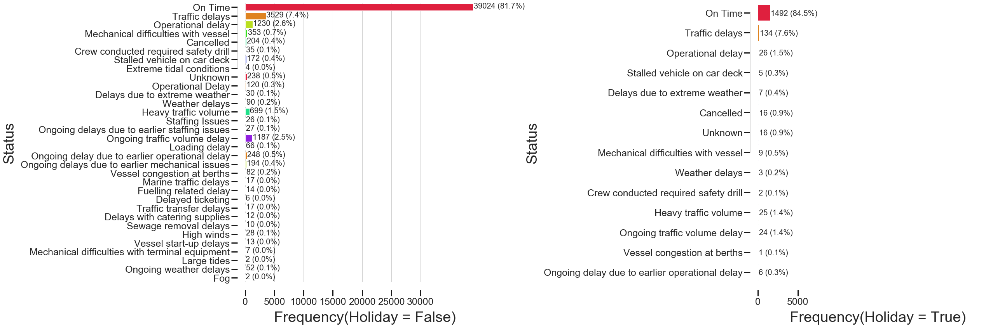

In [452]:
fig, axes = plt.subplots(1, 2, figsize=(36, 12))
unique_holiday = train['holidays_indicator'].unique()

for i, ax in enumerate(axes.flatten()):
    NUM_COLORS = 8
    cm = plt.get_cmap('gist_rainbow')
    colors = [cm(1. * j / NUM_COLORS) for j in range(NUM_COLORS)]

    train_holiday = train.loc[train["holidays_indicator"] == unique_holiday[i], :]
    sns.countplot(y='Status', data=train_holiday, palette=colors, ax=ax)

    total = len(train_holiday['Status'])

    holiday_str = unique_holiday[i]
    ## set count and percentage labels above bars
    for p in ax.patches:
        percentage = '{} ({:.1f}%)'.format(p.get_width(),
                                           100 * p.get_width() / total)
        x = p.get_x() + p.get_width() + 88
        y = p.get_y() + p.get_height() / 1.5
        ax.annotate(percentage, (x, y), size=20)

    ax.set_xlabel("Frequency(Holiday = {})".format(holiday_str),
                  size=38,
                  labelpad=12)
    ax.set_ylabel("Status", size=38, labelpad=12)
    #ax.set_title('Delay Status Distributions \n', fontsize=38)

    ax.set_xticks([5000 * k for k in range(7)])

    ax.spines['left'].set_bounds(0, 7)
    ax.tick_params(axis="x",
                   direction='out',
                   which='major',
                   length=16,
                   width=3,
                   color='k',
                   labelsize=25)
    ax.tick_params(axis="y",
                   direction='out',
                   which='major',
                   length=16,
                   width=3,
                   color='k',
                   labelsize=25)
    adjust_spines(ax, ['left', 'bottom'])

plt.tight_layout()

In [473]:
train

,Vessel.Name,Scheduled.Departure,Status,Trip,Day,Month,Day.of.Month,Year,Full.Date,Delay.Indicator,...,Scheduled.Departure.min,Vessel.Name_Kfold_Target_Enc,Trip_Kfold_Target_Enc,Day.of.Month_Kfold_Target_Enc,weekend.Indicator,Date_time,holidays_indicator,Num.of.sailings,Round_time,Round_Hour
0,Spirit of British Columbia,07:00,On Time,Tsawwassen to Swartz Bay,6,8,28,2016,2016-08-28,0,...,420,0.202073,0.156044,0.192552,True,2016-08-28 07:00:00,False,127,2016-08-28 07:00:00,07
1,Queen of New Westminster,08:00,On Time,Tsawwassen to Swartz Bay,6,8,28,2016,2016-08-28,0,...,480,0.117647,0.156044,0.192552,True,2016-08-28 08:00:00,False,127,2016-08-28 08:00:00,08
2,Spirit of Vancouver Island,09:00,On Time,Tsawwassen to Swartz Bay,6,8,28,2016,2016-08-28,0,...,540,0.171150,0.156044,0.192552,True,2016-08-28 09:00:00,False,127,2016-08-28 09:00:00,09
3,Coastal Celebration,10:00,On Time,Tsawwassen to Swartz Bay,6,8,28,2016,2016-08-28,0,...,600,0.159859,0.156044,0.192552,True,2016-08-28 10:00:00,False,127,2016-08-28 10:00:00,10
4,Spirit of British Columbia,11:00,On Time,Tsawwassen to Swartz Bay,6,8,28,2016,2016-08-28,0,...,660,0.202073,0.156044,0.192552,True,2016-08-28 11:00:00,False,127,2016-08-28 11:00:00,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49499,Coastal Celebration,13:00,On Time,Swartz Bay to Tsawwassen,0,11,27,2017,2017-11-27,0,...,780,0.154498,0.169185,0.192721,False,2017-11-27 13:00:00,False,45,2017-11-27 13:00:00,13
49500,Spirit of Vancouver Island,15:00,Delays with catering supplies,Swartz Bay to Tsawwassen,0,11,27,2017,2017-11-27,1,...,900,0.194069,0.169185,0.192721,False,2017-11-27 15:00:00,False,45,2017-11-27 15:00:00,15
49501,Coastal Celebration,17:00,On Time,Swartz Bay to Tsawwassen,0,11,27,2017,2017-11-27,0,...,1020,0.154498,0.169185,0.192721,False,2017-11-27 17:00:00,False,45,2017-11-27 17:00:00,17
49502,Spirit of Vancouver Island,19:00,Unknown,Swartz Bay to Tsawwassen,0,11,27,2017,2017-11-27,1,...,1140,0.194069,0.169185,0.192721,False,2017-11-27 19:00:00,False,45,2017-11-27 19:00:00,19


#### Visualization of Day to the response

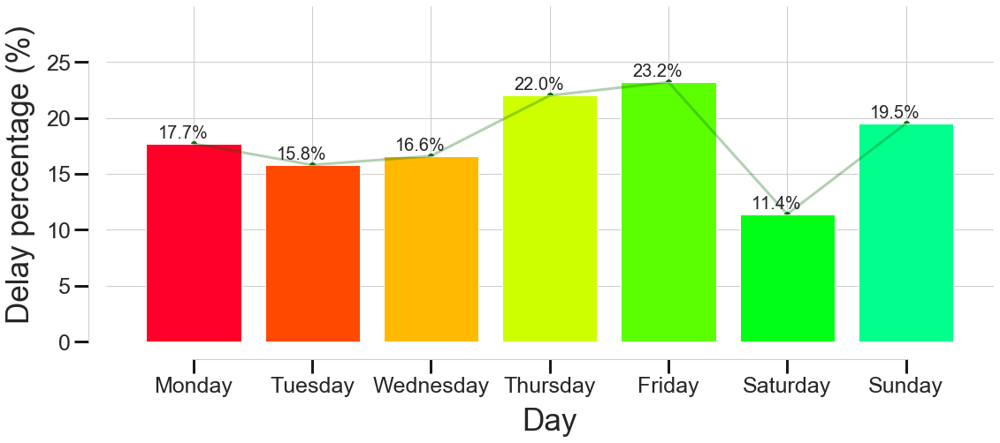

In [464]:
import datetime as dt
df['weekday'] = df['datetime'].apply(lambda x: dt.datetime.strftime(x, '%A'))
train['Day'] = train['Day'].astype('object')
train_day = train[["Day","Delay.Indicator"]]
train_day = train_day.groupby("Day").mean().reset_index()

fig, ax = plt.subplots(1,1,figsize=(18,7))
NUM_COLORS = 12
cm = plt.get_cmap('gist_rainbow')
colors = [cm(1.*i/NUM_COLORS) for i in range(NUM_COLORS)]

Day = pd.Series(["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"])
Indicator = list(train_day["Delay.Indicator"].apply(lambda x: round(x*100,1)))

ax.bar(Day,Indicator,color = colors)
ax.plot(Day,Indicator,alpha = 0.3,color = 'darkgreen',linewidth = "3")
ax.scatter(Day,Indicator,alpha = 0.9,color = 'darkgreen')
for p in ax.patches:
        percentage = '{}%'.format(p.get_height())
        x = p.get_x() + p.get_width()/8
        y = p.get_y() + p.get_height()+0.5
        ax.annotate(percentage, (x, y),size = 20)

ax.set_xticks(Day)


ax.spines['bottom'].set_bounds(0,6)

ax.tick_params(axis= "x",direction = 'out',which='major', length=16,width=3, color='k',labelsize = 25)
ax.tick_params(axis= "y",direction = 'out',which='major', length=16,width=3, color='k',labelsize = 25)
ax.set_yticks([i for i in range(0,31,5)])
ax.set_ylabel("Delay percentage (%)",size = 35,labelpad=12)
ax.set_xlabel("Day",size = 35,labelpad=12)
adjust_spines(ax, ['left', 'bottom'])

In [469]:
train["Day"]

0        6
1        6
2        6
3        6
4        6
        ..
49499    0
49500    0
49501    0
49502    0
49503    0
Name: Day, Length: 49504, dtype: object

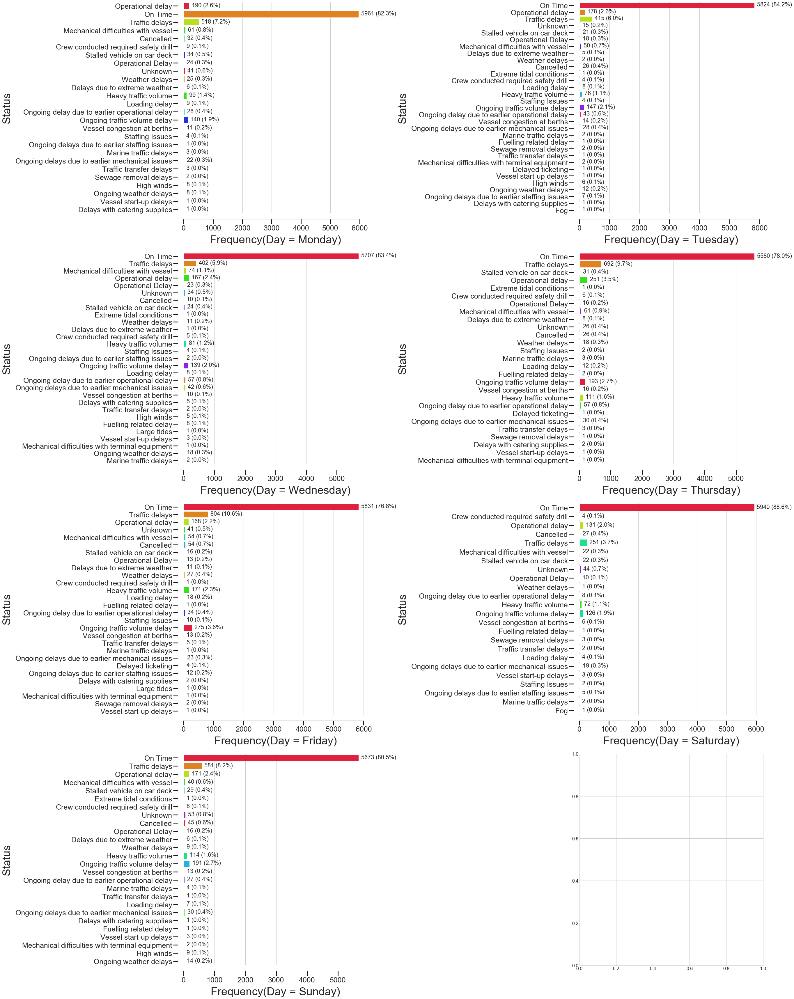

In [478]:
unique_day = Day

fig, axes = plt.subplots(4, 2, figsize=(38, 48))
for i, ax in enumerate(axes.flatten()):
    if i == 7:
        break
    NUM_COLORS = 8
    cm = plt.get_cmap('gist_rainbow')
    colors = [cm(1. * j / NUM_COLORS) for j in range(NUM_COLORS)]

    train_day = train.loc[train["Day"] == unique_day[i], :]
    sns.countplot(y='Status', data=train_day, palette=colors, ax=ax)

    total = len(train_day['Status'])

    Day_str = unique_day[i]
    ## set count and percentage labels above bars
    for p in ax.patches:
        percentage = '{} ({:.1f}%)'.format(p.get_width(),
                                           100 * p.get_width() / total)
        x = p.get_x() + p.get_width() + 88
        y = p.get_y() + p.get_height() / 1.5
        ax.annotate(percentage, (x, y), size=20)

    ax.set_xlabel("Frequency(Day = {})".format(Day_str),
                  size=38,
                  labelpad=12)
    ax.set_ylabel("Status", size=38, labelpad=12)
    #ax.set_title('Delay Status Distributions \n', fontsize=38)

    #ax.set_xticks([1000 * k for k in range(7)])

    ax.spines['left'].set_bounds(0, len(unique_hour)-1)
    ax.tick_params(axis="x",
                   direction='out',
                   which='major',
                   length=16,
                   width=3,
                   color='k',
                   labelsize=25)
    ax.tick_params(axis="y",
                   direction='out',
                   which='major',
                   length=16,
                   width=3,
                   color='k',
                   labelsize=25)
    adjust_spines(ax, ['left', 'bottom'])

plt.tight_layout(h_pad = 1.28)

#### Visualization of number of daily sailings against delay frequency

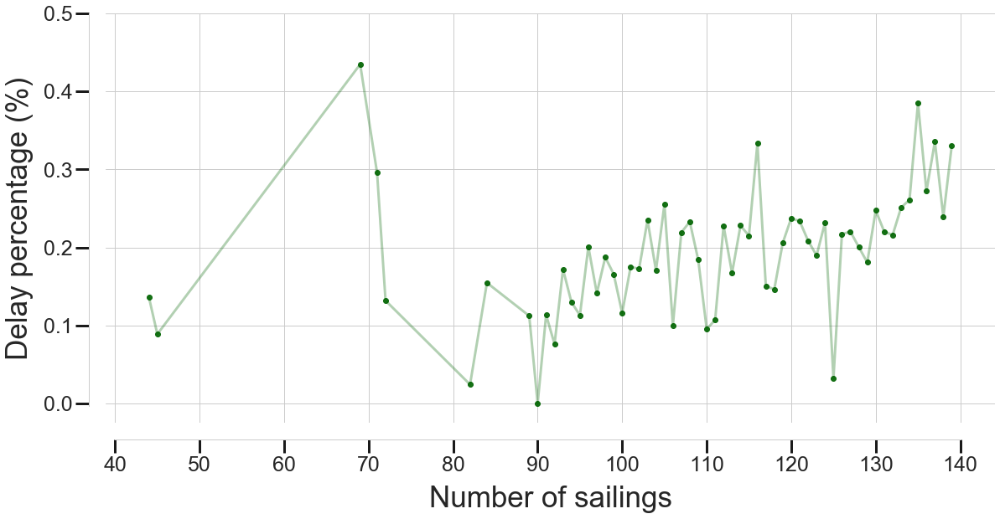

In [479]:
train_sa = train[["Num.of.sailings","Delay.Indicator"]]


train_sail = train_sa.groupby("Num.of.sailings").mean().reset_index()


fig, ax = plt.subplots(1,1,figsize=(19,9))


sailings = train_sail["Num.of.sailings"]
delay = train_sail["Delay.Indicator"]

ax.plot(sailings,delay,alpha = 0.3,color = 'darkgreen',linewidth = "3")
ax.scatter(sailings,delay,alpha = 0.9,color = 'darkgreen')

ax.tick_params(axis= "x",direction = 'out',which='major', length=16,width=3, color='k',labelsize = 25)
ax.tick_params(axis= "y",direction = 'out',which='major', length=16,width=3, color='k',labelsize = 25)
ax.set_xticks([i for i in range(40,150,10)])
ax.set_yticks([0.1*i for i in range(0,6)])
ax.set_ylabel("Delay percentage (%)",size = 35,labelpad=12)
ax.set_xlabel("Number of sailings",size = 35,labelpad=12)
adjust_spines(ax, ['left', 'bottom'])

## Vancouver

Temperature is associated with Dew.point and Temperatrure is also somewhat correlated with Relative.Humidity.

In [480]:
vancouver.drop("Humidex",axis=1,inplace = True)

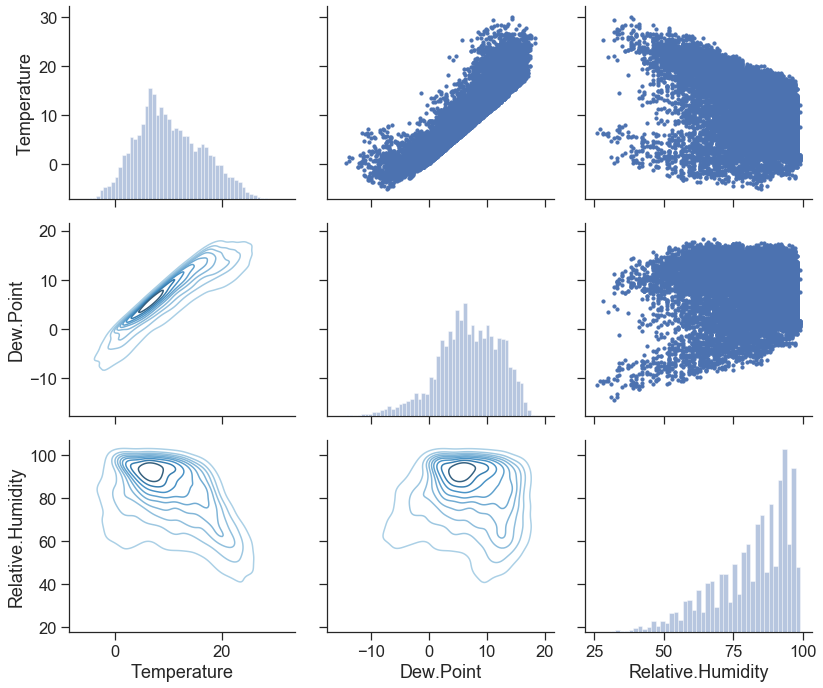

In [481]:
## pairplot
sns.set(style = "ticks", rc={'figure.figsize':(10,10),"xtick.major.size": 8, "ytick.major.size": 8},font_scale = 1.5)
vancouver["Month"] = vancouver["Year"].astype('object')

whe_dat = vancouver.loc[:,["Temperature","Dew.Point","Relative.Humidity"]]

g = sns.PairGrid(whe_dat, palette=["red"],height = 3.3,aspect = 1.2)

g.map_upper(plt.scatter, s=10)
g.map_diag(sns.distplot, kde=False)
g.map_lower(sns.kdeplot, cmap="Blues_d")
g.map_lower(corrfunc)

## Victoria

InterpolateQuadratic_Tem is correlated with InterpolateQuadratic_Dew and InterpolateQuadratic_Humi

In [482]:
victoria.reset_index(inplace = True)

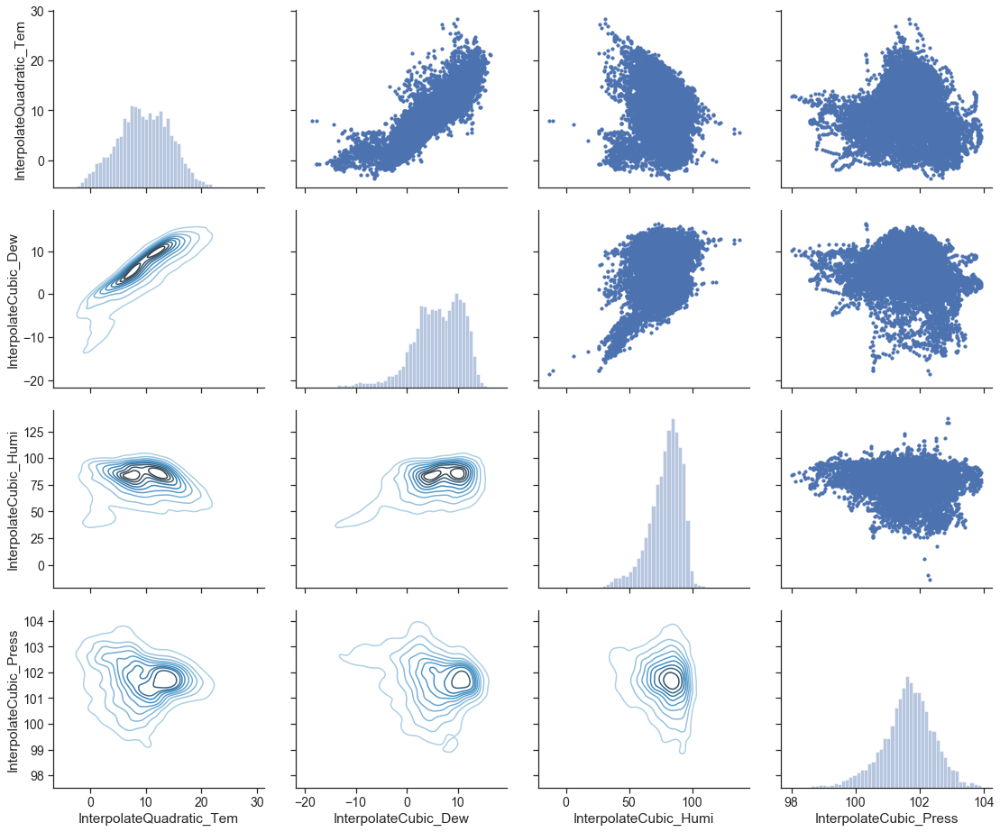

In [483]:
## pairplot
sns.set(style = "ticks", rc={'figure.figsize':(15,15)},font_scale = 1.28)
whe_dat = victoria.iloc[:,[7,9,10,11]]
whe_dat.dropna(axis =0,inplace = True)
g = sns.PairGrid(whe_dat, palette=["red"],height = 3.3,aspect = 1.2)

g.map_upper(plt.scatter, s=10)
g.map_diag(sns.distplot, kde=False)
g.map_lower(sns.kdeplot, cmap="Blues_d")
g.map_lower(corrfunc)

# Feature seletion

## Vancouver

In [489]:
## temperature lags
vancouver['van_tem_lag1'] = vancouver['Temperature'].shift(1)
vancouver['van_tem_lag2'] = vancouver['Temperature'].shift(2)

## Dew.Point lags
vancouver['van_dew_lag1'] = vancouver['Dew.Point'].shift(1)
vancouver['van_dew_lag2'] = vancouver['Dew.Point'].shift(2)

## Relative.Humidity lags
vancouver['van_hum_lag1'] = vancouver['Relative.Humidity'].shift(1)
vancouver['van_hum_lag2'] = vancouver['Relative.Humidity'].shift(2)

In [490]:
vancouver.dropna(axis=0,inplace=True)

In [491]:
## Extract the datetime rounded to hour 
train["Round_time"] = train["Date_time"].dt.round("H")
test["Round_time"] = test["Date_time"].dt.round("H")

In [492]:
vancouver_merge = vancouver.iloc[:,[0,5,6,7,12,13,14,15,16,17]]

In [493]:
train.set_index("Round_time",inplace = True)
vancouver_merge.set_index("Date.Time",inplace =True)
train = train.merge(vancouver_merge,left_index = True, right_index = True,how = "left")

In [494]:
test.set_index("Round_time",inplace = True)
test = test.merge(vancouver_merge,left_index = True, right_index = True,how = "left")

In [495]:
dat_wet = train.loc[train.Status.isin(["On Time","Weather delay"]),:]

In [497]:
dat_wet

,Vessel.Name,Scheduled.Departure,Status,Trip,Day,Month,Day.of.Month,Year,Full.Date,Delay.Indicator,...,Round_Hour,Temperature,Dew.Point,Relative.Humidity,van_tem_lag1,van_tem_lag2,van_dew_lag1,van_dew_lag2,van_hum_lag1,van_hum_lag2
2016-08-28 05:00:00,Queen of Alberni,05:15,On Time,Tsawwassen to Duke Point,Sunday,8,28,2016,2016-08-28,0,...,05,15.6,12.3,81.0,15.4,15.7,12.1,12.2,81.0,79.0
2016-08-28 05:00:00,Coastal Inspiration,05:15,On Time,Duke Point to Tsawwassen,Sunday,8,28,2016,2016-08-28,0,...,05,15.6,12.3,81.0,15.4,15.7,12.1,12.2,81.0,79.0
2016-08-28 06:00:00,Queen of Cumberland,05:30,On Time,Swartz Bay to Southern Gulf Islands,Sunday,8,28,2016,2016-08-28,0,...,06,15.8,12.1,79.0,15.6,15.4,12.3,12.1,81.0,81.0
2016-08-28 06:00:00,Mayne Queen,06:00,On Time,Swartz Bay to Southern Gulf Islands,Sunday,8,28,2016,2016-08-28,0,...,06,15.8,12.1,79.0,15.6,15.4,12.3,12.1,81.0,81.0
2016-08-28 06:00:00,Coastal Renaissance,06:20,On Time,Departure Bay to Horseshoe Bay,Sunday,8,28,2016,2016-08-28,0,...,06,15.8,12.1,79.0,15.6,15.4,12.3,12.1,81.0,81.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-11-27 21:00:00,Spirit of Vancouver Island,21:00,On Time,Tsawwassen to Swartz Bay,Monday,11,27,2017,2017-11-27,0,...,21,7.5,6.0,90.0,7.2,7.3,5.9,6.2,91.0,92.0
2017-11-27 21:00:00,Skeena Queen,21:00,On Time,Swartz Bay to Fulford Harbour (Saltspring Is.),Monday,11,27,2017,2017-11-27,0,...,21,7.5,6.0,90.0,7.2,7.3,5.9,6.2,91.0,92.0
2017-11-27 21:00:00,Coastal Celebration,21:00,On Time,Swartz Bay to Tsawwassen,Monday,11,27,2017,2017-11-27,0,...,21,7.5,6.0,90.0,7.2,7.3,5.9,6.2,91.0,92.0
2017-11-27 22:00:00,Queen of Cowichan,22:30,On Time,Tsawwassen to Duke Point,Monday,11,27,2017,2017-11-27,0,...,22,7.4,5.9,90.0,7.5,7.2,6.0,5.9,90.0,91.0


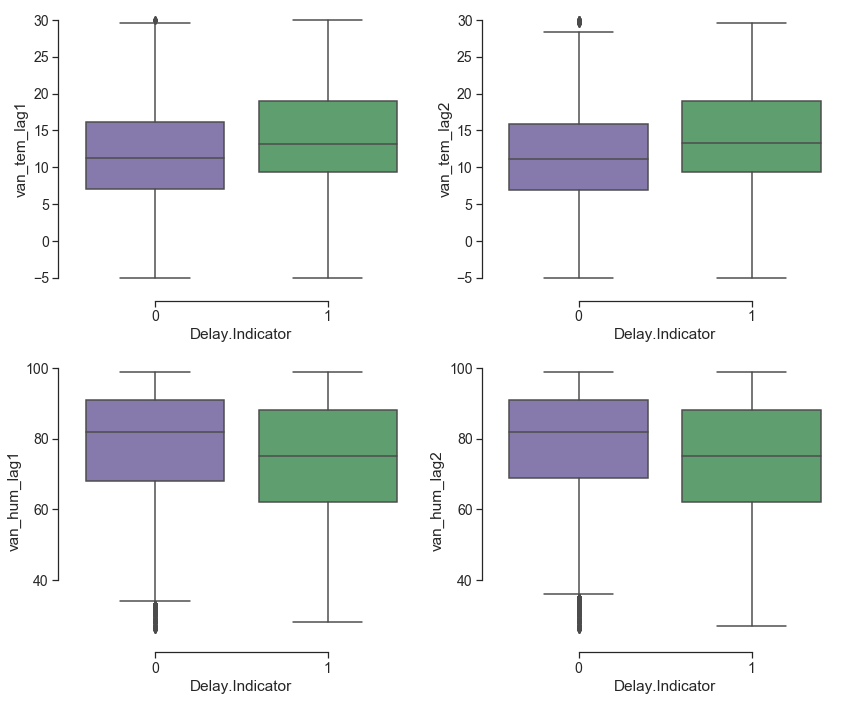

In [498]:
fig,axes = plt.subplots(2,2,figsize=(12,10))

sns.boxplot(x="Delay.Indicator", y="van_tem_lag1",
             palette=["m", "g"],
            data=train,ax = axes[0,0])
sns.boxplot(x="Delay.Indicator", y="van_tem_lag2",
             palette=["m", "g"],
            data=train,ax = axes[0,1])
sns.boxplot(x="Delay.Indicator", y="van_hum_lag1",
             palette=["m", "g"],
            data=train,ax = axes[1,0])
sns.boxplot(x="Delay.Indicator", y="van_hum_lag2",
             palette=["m", "g"],
            data=train,ax = axes[1,1])

sns.despine(offset=10, trim=True)

plt.tight_layout()

## Victoria

Visualizing the correlation between vic_tem_lag1 and delay frequency.

In [513]:
train

,Vessel.Name,Scheduled.Departure,Status,Trip,Day,Month,Day.of.Month,Year,Full.Date,Delay.Indicator,...,Round_Hour,Temperature,Dew.Point,Relative.Humidity,van_tem_lag1,van_tem_lag2,van_dew_lag1,van_dew_lag2,van_hum_lag1,van_hum_lag2
2016-08-28 05:00:00,Queen of Alberni,05:15,On Time,Tsawwassen to Duke Point,Sunday,8,28,2016,2016-08-28,0,...,05,15.6,12.3,81.0,15.4,15.7,12.1,12.2,81.0,79.0
2016-08-28 05:00:00,Coastal Inspiration,05:15,On Time,Duke Point to Tsawwassen,Sunday,8,28,2016,2016-08-28,0,...,05,15.6,12.3,81.0,15.4,15.7,12.1,12.2,81.0,79.0
2016-08-28 06:00:00,Queen of Cumberland,05:30,On Time,Swartz Bay to Southern Gulf Islands,Sunday,8,28,2016,2016-08-28,0,...,06,15.8,12.1,79.0,15.6,15.4,12.3,12.1,81.0,81.0
2016-08-28 06:00:00,Mayne Queen,06:00,On Time,Swartz Bay to Southern Gulf Islands,Sunday,8,28,2016,2016-08-28,0,...,06,15.8,12.1,79.0,15.6,15.4,12.3,12.1,81.0,81.0
2016-08-28 06:00:00,Coastal Renaissance,06:20,On Time,Departure Bay to Horseshoe Bay,Sunday,8,28,2016,2016-08-28,0,...,06,15.8,12.1,79.0,15.6,15.4,12.3,12.1,81.0,81.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-11-27 21:00:00,Spirit of Vancouver Island,21:00,On Time,Tsawwassen to Swartz Bay,Monday,11,27,2017,2017-11-27,0,...,21,7.5,6.0,90.0,7.2,7.3,5.9,6.2,91.0,92.0
2017-11-27 21:00:00,Skeena Queen,21:00,On Time,Swartz Bay to Fulford Harbour (Saltspring Is.),Monday,11,27,2017,2017-11-27,0,...,21,7.5,6.0,90.0,7.2,7.3,5.9,6.2,91.0,92.0
2017-11-27 21:00:00,Coastal Celebration,21:00,On Time,Swartz Bay to Tsawwassen,Monday,11,27,2017,2017-11-27,0,...,21,7.5,6.0,90.0,7.2,7.3,5.9,6.2,91.0,92.0
2017-11-27 22:00:00,Queen of Cowichan,22:30,On Time,Tsawwassen to Duke Point,Monday,11,27,2017,2017-11-27,0,...,22,7.4,5.9,90.0,7.5,7.2,6.0,5.9,90.0,91.0


In [499]:
victoria.dropna(axis=0,inplace = True)

In [506]:
## temperature lags
victoria['vic_tem_lag1'] = victoria['InterpolateQuadratic_Tem'].shift(1)
victoria['vic_tem_lag2'] = victoria['InterpolateQuadratic_Tem'].shift(2)

## Dew.Point lags
victoria['vic_dew_lag1'] = victoria['InterpolateCubic_Dew'].shift(1)
victoria['vic_dew_lag2'] = victoria['InterpolateCubic_Dew'].shift(2)

## Relative.Humidity lags
victoria['vic_hum_lag1'] = victoria['InterpolateCubic_Humi'].shift(1)
victoria['vic_hum_lag2'] = victoria['InterpolateCubic_Humi'].shift(2)

## press lags
victoria['vic_press_lag1'] = victoria['InterpolateCubic_Press'].shift(1)
victoria['vic_press_lag2'] = victoria['InterpolateCubic_Press'].shift(2)

In [507]:
victoria.dropna(axis=0,inplace=True)

In [508]:
victoria_merge = victoria.iloc[:,[0,7,9,10,11,12,13,14,15,16,17,18,19]]

In [518]:
victoria_merge.index.name = None

In [520]:
victoria_merge.set_index("Date.Time",inplace = True)
victoria_merge.index.name = None
train = train.merge(victoria_merge,left_index = True, right_index = True,how = "left")

In [521]:
test = test.merge(victoria_merge,left_index = True, right_index = True,how = "left")

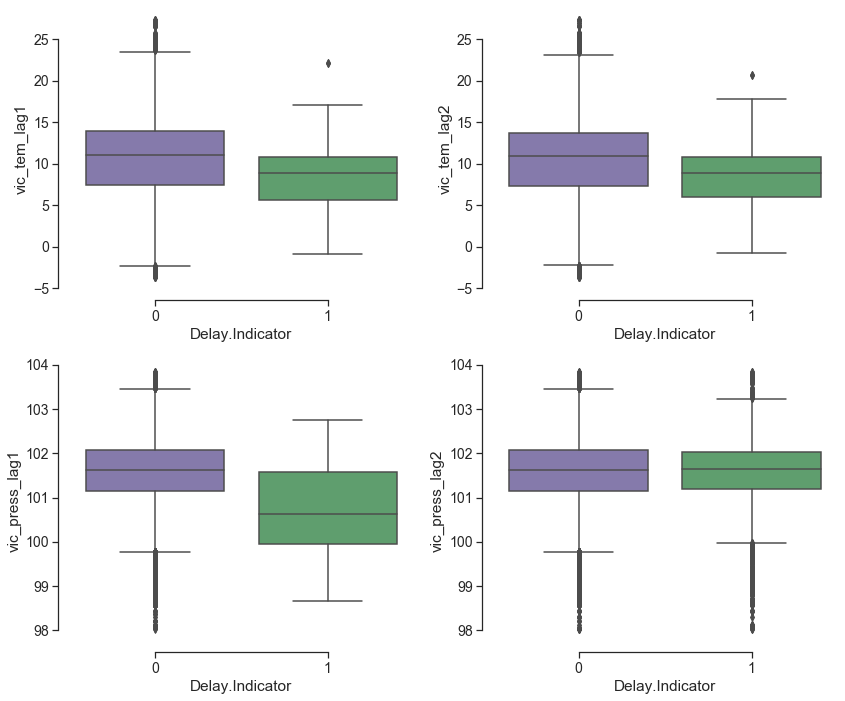

In [522]:
fig,axes = plt.subplots(2,2,figsize=(12,10))

sns.boxplot(x="Delay.Indicator", y="vic_tem_lag1",
             palette=["m", "g"],
            data=train1.loc[train1["Status"].isin(["On Time","Weather delay"])],ax = axes[0,0])
sns.boxplot(x="Delay.Indicator", y="vic_tem_lag2",
             palette=["m", "g"],
            data=train1.loc[train1["Status"].isin(["On Time","Weather delay"])],ax = axes[0,1])
sns.boxplot(x="Delay.Indicator", y="vic_press_lag1",
             palette=["m", "g"],
            data=train1.loc[train1["Status"].isin(["On Time","Weather delay"])],ax = axes[1,0])
sns.boxplot(x="Delay.Indicator", y="vic_press_lag2",
             palette=["m", "g"],
            data=train1,ax = axes[1,1])

sns.despine(offset=10, trim=True)

plt.tight_layout()


## Traffic

In [534]:
traffic["Date"] = pd.to_datetime(traffic["Date"])
traffic.set_index("Date",inplace=True)

### Extracting the traffic features

#### traffic mean at an interval of 10 mins

In [535]:
## feature extration for train traffic mean
train["lag1"] = train["Date_time"].apply(lambda x:lag1_mean(x))
train["lag2"] = train["Date_time"].apply(lambda x:lag2_mean(x))
train["lag3"] = train["Date_time"].apply(lambda x:lag3_mean(x))
train["lag4"] = train["Date_time"].apply(lambda x:lag4_mean(x))

## feature extration for test traffic mean
test["lag1"] = test["Date_time"].apply(lambda x:lag1_mean(x))
test["lag2"] = test["Date_time"].apply(lambda x:lag2_mean(x))
test["lag3"] = test["Date_time"].apply(lambda x:lag3_mean(x))
test["lag4"] = test["Date_time"].apply(lambda x:lag4_mean(x))

In [536]:
## feature extration for train traffic standard deviation
train["lag_std1"] = train["Date_time"].apply(lambda x:lag1_sd(x))
train["lag_std2"] = train["Date_time"].apply(lambda x:lag2_sd(x))
train["lag_std3"] = train["Date_time"].apply(lambda x:lag3_sd(x))

## feature extration for test traffic standard deviation
test["lag_std1"] = test["Date_time"].apply(lambda x:lag1_sd(x))
test["lag_std2"] = test["Date_time"].apply(lambda x:lag2_sd(x))
test["lag_std3"] = test["Date_time"].apply(lambda x:lag3_sd(x))

#### traffic standard deviation at an interval of 10 mins

In [537]:
# indeces of missing values
lag_in_1 = train.loc[train["lag1"].isna(),:].index
lag_in_2 = train.loc[train["lag4"].isna(),:].index
lag_index_std = train.loc[train["lag_std1"].isna(),:].index

In [538]:
## Since lag1 and lag2 before 7:25 are 1.0, we decided to impute all mising lag1 and lag2 with 1.0
train.loc[lag_in_1,"lag1"] = 1.0
train.loc[lag_in_1,"lag2"] = 1.0
train.loc[lag_in_1,"lag3"] = 1.0
train.loc[lag_in_2,'lag4'] = 1.0

train.loc[lag_index_std,"lag_std1"] = 0
train.loc[lag_index_std,"lag_std2"] = 0
train.loc[lag_index_std,"lag_std3"] = 0

train["Delay.Indicator"] = train["Delay.Indicator"].astype('category')

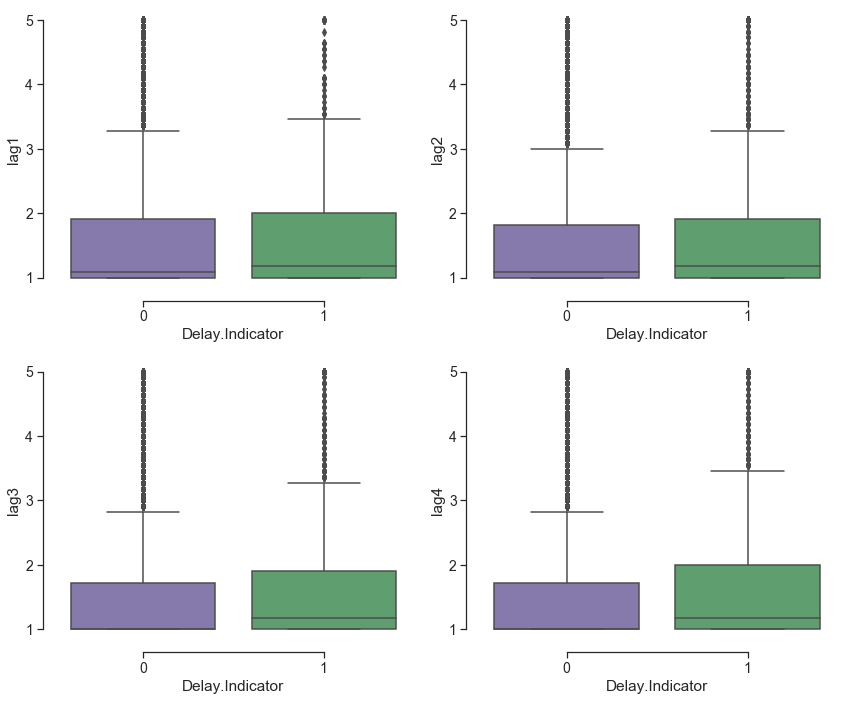

In [557]:
fig,axes = plt.subplots(2,2,figsize=(12,10))

sns.boxplot(x="Delay.Indicator", y="lag1",
             palette=["m", "g"],
            data=train.loc[train["Status"].isin(["On Time","Operational delay"]),:],ax = axes[0,0])
sns.boxplot(x="Delay.Indicator", y="lag2",
             palette=["m", "g"],
            data=train.loc[train["Status"].isin(["On Time","Traffic delays"]),:],ax = axes[0,1])
sns.boxplot(x="Delay.Indicator", y="lag3",
             palette=["m", "g"],
            data=train.loc[train["Status"].isin(["On Time","Traffic delays"]),:],ax = axes[1,0])
sns.boxplot(x="Delay.Indicator", y="lag4",
             palette=["m", "g"],
            data=train.loc[train["Status"].isin(["On Time","Traffic delays"]),:],ax = axes[1,1])

sns.despine(offset=10, trim=True)

plt.tight_layout()

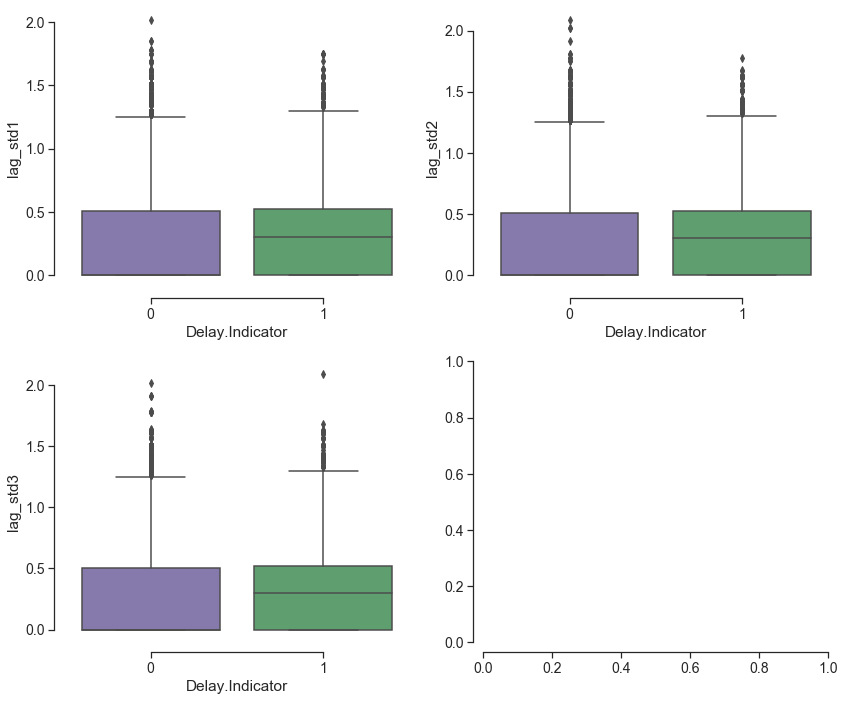

In [558]:
fig,axes = plt.subplots(2,2,figsize=(12,10))

sns.boxplot(x="Delay.Indicator", y="lag_std1",
             palette=["m", "g"],
            data=train,ax = axes[0,0])
sns.boxplot(x="Delay.Indicator", y="lag_std2",
             palette=["m", "g"],
            data=train,ax = axes[0,1])
sns.boxplot(x="Delay.Indicator", y="lag_std3",
             palette=["m", "g"],
            data=train,ax = axes[1,0])


sns.despine(offset=10, trim=True)

plt.tight_layout()

# Save data

In [561]:
train.to_csv(r"C:\Users\xfu3\Desktop\Ferry project\traffic_clean3.csv", index = False)

In [599]:
test.to_csv(r"C:\Users\xfu3\Desktop\Ferry project\test_clean3.csv", index = False)